In [363]:
from pdfminer.pdfinterp import PDFResourceManager
from pdfminer.pdfinterp import PDFPageInterpreter
from pdfminer.converter import TextConverter
from pdfminer.layout import LAParams
from pdfminer.pdfpage import PDFPage
from io import BytesIO
from PyPDF2 import PdfFileMerger
from matplotlib import rc
import glob
import re
from math import sqrt
import json
from collections import Counter
from nltk.stem import PorterStemmer
from nltk.tokenize import TreebankWordTokenizer
import json
import pandas as pd
import numpy as np
from bs4 import BeautifulSoup, SoupStrainer
import regex
import base64
from datetime import datetime
import ujson
import sqlite3
from functools import reduce
import requests
import string
import pyodbc
import nltk as nltk
import pymysql
from sqlalchemy import create_engine
import urllib.request 
from __future__ import print_function
import csv
import numpy as np
from nltk.corpus import stopwords
import pandas as pd
import matplotlib.pyplot as plt
import tika
import networkx as nx
tika.TikaClientOnly = True
from tika import parser
import pprint
import pyperclip
import os

In [364]:
os.chdir('/Users/Nashrah/Desktop/Columbia_QMSS/Thesis')
open("articles_97_99.pdf")
open("articles_00_02.pdf")
open("articles_03_06.pdf")
open("articles_07_10.pdf")
open("articles_11_14.pdf")
open("articles_15_16.pdf")
#https://sraf.nd.edu/textual-analysis/resources/#LM%20Sentiment%20Word%20Lists
open("LM_Litigious.pdf")
open("LM_Uncertainty.pdf")
open("LM_Positive.pdf")
open("LM_Negative.pdf")
open("LM_Constraining.pdf")
open("LM_Modal.pdf")

<_io.TextIOWrapper name='LM_Modal.pdf' mode='r' encoding='cp1252'>

In [204]:
#pdfs = ['articles_15_16.pdf']
#merger = PdfFileMerger()

#for pdf in pdfs:
    #merger.append(pdf)

#merger.write("result5.pdf")

In [205]:
def myfunction(pdf):
    
    rsrcmgr = PDFResourceManager()
    retstr = BytesIO()
    codec = 'utf-8'
    laparams = LAParams()
    device = TextConverter(rsrcmgr, retstr, codec=codec, laparams=laparams)
    fp = open(pdf, 'rb')
    interpreter = PDFPageInterpreter(rsrcmgr, device)
    maxpages = 0
    caching = True
    pagenos = set()

# handles multi-paged PDFs
    for page in PDFPage.get_pages(fp, pagenos,
                              maxpages=maxpages,
                              caching=caching,
                              check_extractable=True):interpreter.process_page(page)
    return(retstr.getvalue())
    fp.close()
    device.close()
    retstr.close()

In [206]:
def article_dictionary(pdf):
    article_dictionary = {}
    article_text = myfunction(pdf) 
    article_dictionary = article_text
    with open ('{}.json'.format(pdf), 'w') as file:
        json.dump(article_dictionary.decode('utf-8'), file)
    return json.load(open('{}.json'.format(pdf), 'r')) 

In [249]:
dict1 = article_dictionary('articles_97_99.pdf')
dict2 = article_dictionary('articles_00_02.pdf')
dict3 = article_dictionary('articles_03_06.pdf')
dict4 = article_dictionary('articles_07_10.pdf')
dict5 = article_dictionary('articles_11_14.pdf')
dict6 = article_dictionary('articles_15_16.pdf')

In [7]:
litigious = article_dictionary('LM_Litigious.pdf')
uncertainty = article_dictionary('LM_Uncertainty.pdf')
positive = article_dictionary('LM_Positive.pdf')
negative = article_dictionary('LM_Negative.pdf')
constraining = article_dictionary('LM_Constraining.pdf')
modal = article_dictionary('LM_Modal.pdf')

In [8]:
#for later
#parsed = parser.from_file('result5.pdf', 'http://localhost:9998/tika')
#print(parsed['content'].strip())

In [208]:
tokenizer = TreebankWordTokenizer()
stemmer = PorterStemmer()

def to_bows(doc):
    tokens = tokenizer.tokenize(doc)
    stemmed_tokens = []
    for token in tokens:
        token = re.sub('[^A-z]', '', token)
        if token:
            stemmed_tokens.append(stemmer.stem(token))
    # The loop above could just become
    # stemmed_tokens = [stemmer.stem(token) for token in tokens]
    # if you want to learn list comprehensions
    return Counter(stemmed_tokens)

In [209]:
string1 = pd.DataFrame(to_bows(dict1).most_common(), columns=['name','count'])
string1['Timeframe'] = '97 to 99'
string2 = pd.DataFrame(to_bows(dict2).most_common(), columns=['name','count'])
string2['Timeframe'] = '00 to 02'
string3 = pd.DataFrame(to_bows(dict3).most_common(), columns=['name','count'])
string3['Timeframe'] = '03 to 06'
string4 = pd.DataFrame(to_bows(dict4).most_common(), columns=['name','count'])
string4['Timeframe'] = '07 to 10'
string5 = pd.DataFrame(to_bows(dict5).most_common(), columns=['name','count'])
string5['Timeframe'] = '11 to 14'
string6 = pd.DataFrame(to_bows(dict6).most_common(), columns=['name','count'])
string6['Timeframe'] = '15 to 16'

In [210]:
litigious1 = pd.DataFrame(to_bows(litigious).most_common(), columns=['name','count'])
litigious1 = pd.DataFrame(litigious1.name)
uncertainty1 = pd.DataFrame(to_bows(uncertainty).most_common(), columns=['name','count'])
uncertainty1 = pd.DataFrame(uncertainty1.name)
positive1 = pd.DataFrame(to_bows(positive).most_common(), columns=['name','count'])
positive1 = pd.DataFrame(positive1.name)
negative1 = pd.DataFrame(to_bows(negative).most_common(), columns=['name','count'])
negative1 = pd.DataFrame(negative1.name)
constraining1 = pd.DataFrame(to_bows(constraining).most_common(), columns=['name','count'])
constraining1 = pd.DataFrame(constraining1.name)
modal1 = pd.DataFrame(to_bows(modal).most_common(), columns=['name','count'])
modal1 = pd.DataFrame(modal1.name)

In [211]:
def remove_stopwords(string):
    words = set(stopwords.words('english'))
    symbols = ['{','}','(',')','[',']','.',',',':',';','+','-','*','/','&','|','<','>','=','~','`','``']
    for name in string:
        string_sub = string[~string.name.isin(words)]
        return string_sub[~string_sub.name.isin(symbols)]

In [212]:
string1_sub = remove_stopwords(string1)
string2_sub = remove_stopwords(string2)
string3_sub = remove_stopwords(string3)
string4_sub = remove_stopwords(string4)
string5_sub = remove_stopwords(string5)
string6_sub = remove_stopwords(string6)
string6_sub.shape

(1487, 3)

In [213]:
dfs = [string2_sub, string3_sub, string4_sub, string5_sub, string6_sub]
string_cbd = string1.append(dfs)
string_cbd.shape

(16633, 3)

In [214]:
cross_words = list(reduce(np.intersect1d, [string1_sub.name, string2_sub.name, string3_sub.name]))

In [225]:
cross_words = [x for x in cross_words if len(x) > 2]
len(cross_words)

1202

In [248]:
data_frames = [string1_sub[['name','count']], string2_sub[['name','count']], string3_sub[['name','count']], string4_sub[['name','count']], string5_sub[['name','count']], string6_sub[['name','count']]]
cross_merged = reduce(lambda  left,right: pd.merge(left,right,on=['name'],
                                            how='inner'), data_frames)
list_of_names = ['name','count1','count2','count3','count4','count5','count6']
cross_merged.columns = list_of_names
cross_merged['Total'] = cross_merged.count1 + cross_merged.count2 + cross_merged.count3 + cross_merged.count4 + cross_merged.count5 + cross_merged.count6
cross_merged.sort_values(by=['Total'], ascending=False)

cross_merged["Label"] = np.where(cross_merged.name.isin(litigious1.name), "litigious", 
                               np.where(cross_merged.name.isin(uncertainty1.name), "uncertainty",
                                        np.where(cross_merged.name.isin(positive1.name), "positive",
                                                 np.where(cross_merged.name.isin(negative1.name), "negative",
                                                          np.where(cross_merged.name.isin(constraining1.name), "constraining",
                                                                   np.where(cross_merged.name.isin(modal1.name), "modal",
                                                                            None))))))
#cross_merged_sub = cross_merged[(cross_merged.Label == 'negative')]

In [217]:
string_cbd["Label"] = np.where(string_cbd.name.isin(litigious1.name), "litigious", 
                               np.where(string_cbd.name.isin(uncertainty1.name), "uncertainty",
                                        np.where(string_cbd.name.isin(positive1.name), "positive",
                                                 np.where(string_cbd.name.isin(negative1.name), "negative",
                                                          np.where(string_cbd.name.isin(constraining1.name), "constraining",
                                                                   np.where(string_cbd.name.isin(modal1.name), "modal",
                                                                            "None"))))))
cbd_sub = string_cbd[(string_cbd.Label == 'negative')]

In [274]:
remove = ['None']
string_cbd1 = string_cbd[~string_cbd['Label'].isin(remove)]
string_cbd1.to_csv('string_data.csv')

In [366]:
edges = pd.read_csv('edge_data.csv')
node = pd.read_csv('node_data.csv')
labelnode = pd.read_csv('labelnode_data.csv')
l_count = pd.read_csv('L_Count.csv')
t_count = pd.read_csv('T_Count.csv')
t_perc = pd.read_csv('L_TF_Percent2.csv')
t_pchange = pd.read_csv('L_PChange.csv')

In [330]:
#https://www.kaggle.com/jncharon/python-network-graph/notebook
df_nodes = labelnode
df_edges = labelnode
import warnings
warnings.filterwarnings('ignore')

G = nx.Graph()

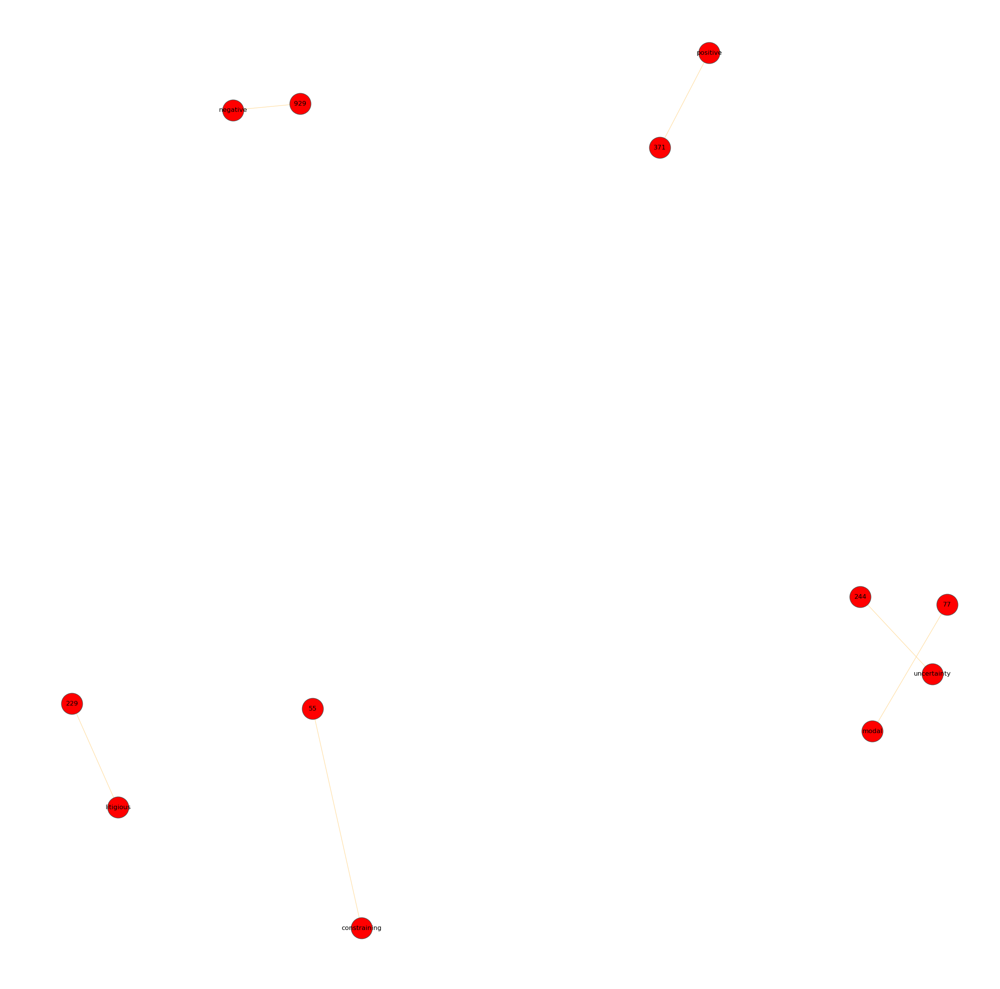

In [339]:
for index, row in df_nodes.iterrows():
    G.add_node(row['Label'],group=['TimeFrameGroup'], nodesize=row['CountofWords'])
    
for index, row in df_edges.iterrows():
    G.add_weighted_edges_from([(row['Label'],row['TimeFrameGroup'],row['Weight_Words'])])
    
color_map = {1:'#f09494', 2:'#eebcbc', 3:'#72bbd0', 4:'#91f0a1', 5:'#629fff', 6:'#bcc2f2'} 

plt.figure(figsize=(25,25))
options = {
    'edge_color': '#FFDEA2',
    'width': 1,
    'with_labels': True,
    'font_weight': 'regular',
}

#colors = [color_map[G.node[node]['Label']] for node in G]
#sizes = [G.node[df_nodes['Label']]*10 for node in G]

"""
Using the spring layout : 
- k controls the distance between the nodes and varies between 0 and 1
- iterations is the number of times simulated annealing is run
default k=0.1 and iterations=50
"""
nx.draw(G, node_size=row['CountofWords'], pos=nx.spring_layout(G, k=0.25, iterations=50), **options)
ax = plt.gca()
ax.collections[0].set_edgecolor("#555555") 
plt.show()

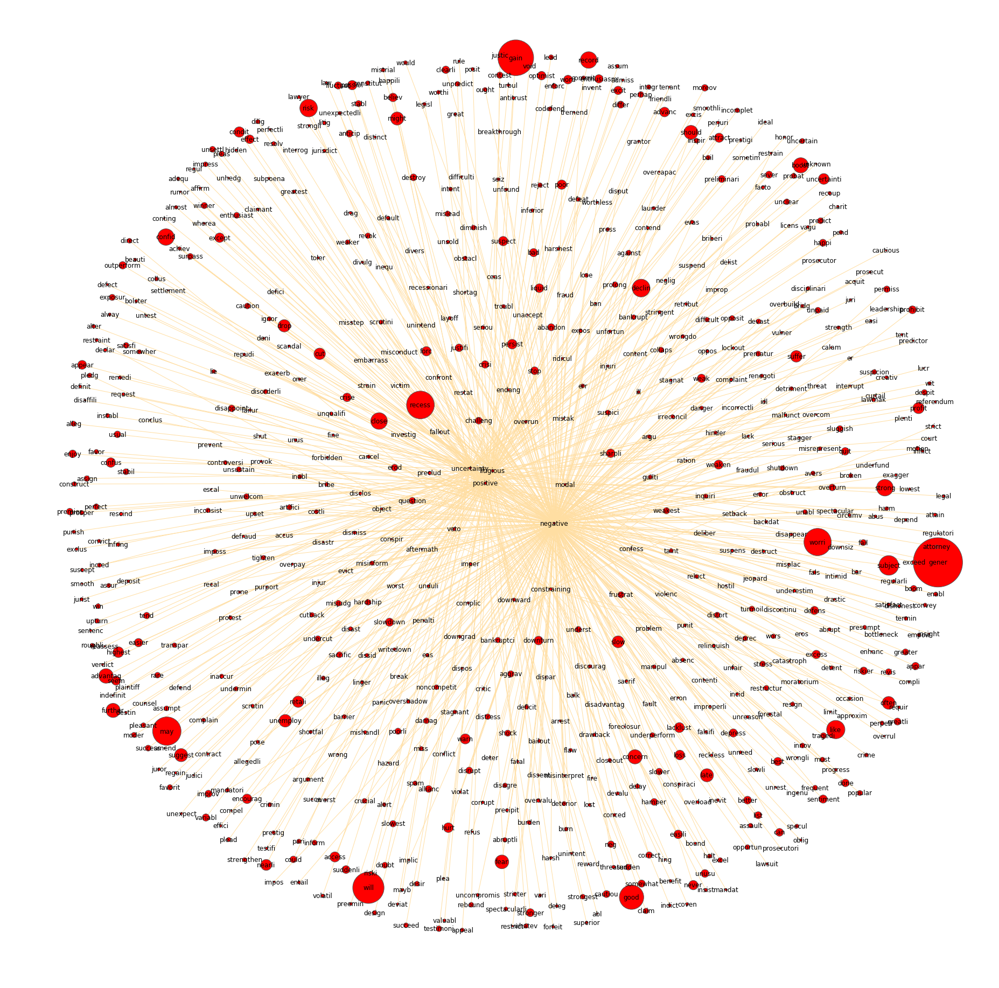

In [313]:
df_nodes = node
df_edges = node
import warnings
warnings.filterwarnings('ignore')

G = nx.Graph()
for index, row in df_nodes.iterrows():
    G.add_node(row['name'],group=['Count1'], nodesize=row['count'])
    
for index, row in df_edges.iterrows():
    G.add_weighted_edges_from([(row['name'],row['Label'],row['Weight1'])])
    
color_map = {1:'#f09494', 2:'#eebcbc', 3:'#72bbd0', 4:'#91f0a1', 5:'#629fff', 6:'#bcc2f2'} 

plt.figure(figsize=(25,25))
options = {
    'edge_color': '#FFDEA2',
    'width': 1,
    'with_labels': True,
    'font_weight': 'regular',
}

#colors = [color_map[G.node(row=['Timeframe'])] for node in G]
#sizes = [G.node['count']*10 for node in G]

"""
Using the spring layout : 
- k controls the distance between the nodes and varies between 0 and 1
- iterations is the number of times simulated annealing is run
default k=0.1 and iterations=50
"""
nx.draw(G, nodesize=row['count'], pos=nx.spring_layout(G, k=0.25, iterations=50), **options)
ax = plt.gca()
ax.collections[0].set_edgecolor("#555555") 
plt.show()

In [402]:
node_97to99 = node[(node.Timeframe == '97 to 99')]
node_00to02 = node[(node.Timeframe == '00 to 02')]
node_03to06 = node[(node.Timeframe == '03 to 06')]
node_07to10 = node[(node.Timeframe == '07 to 10')]
node_11to14 = node[(node.Timeframe == '11 to 14')]
node_15to16 = node[(node.Timeframe == '15 to 16')]

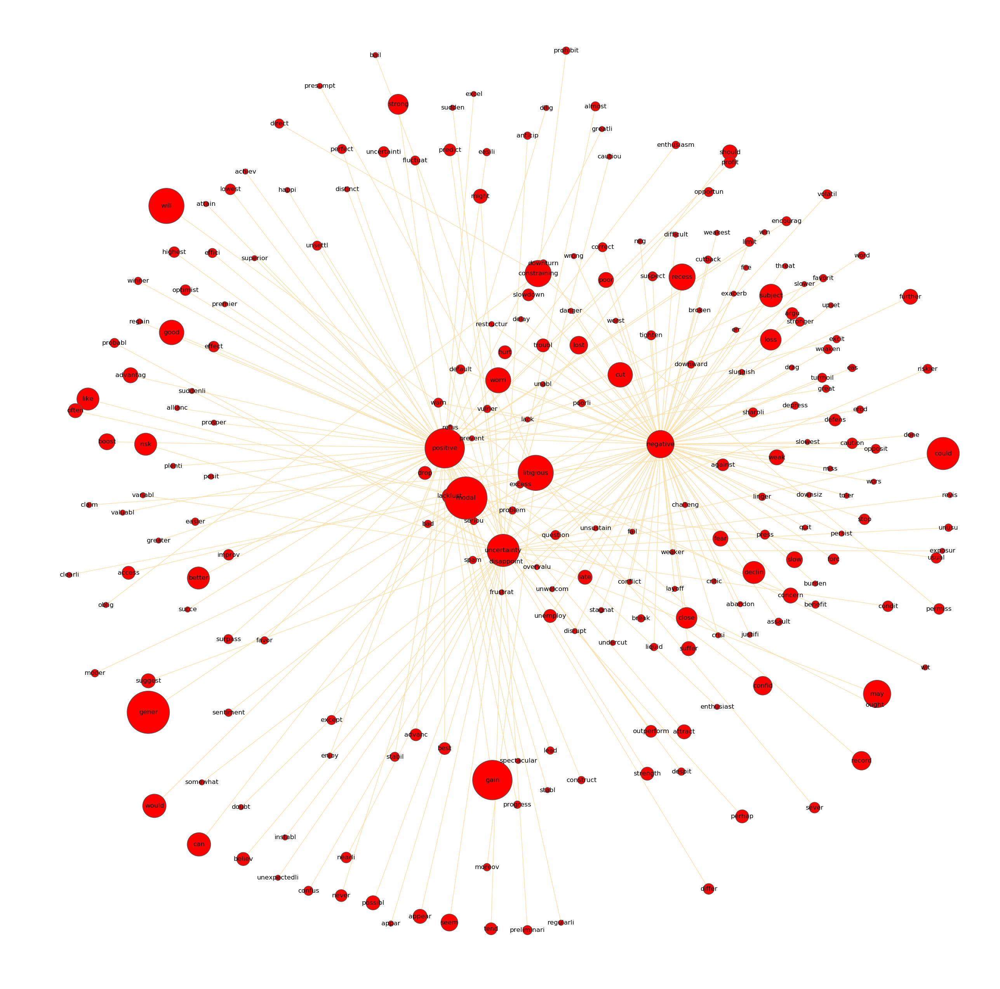

In [401]:
df_nodes = node_97to99
df_edges = node_97to99
import warnings
warnings.filterwarnings('ignore')

G = nx.Graph()
for index, row in df_nodes.iterrows():
    G.add_node(row['name'],group=['Count1'], nodesize=row['count'])
    
for index, row in df_edges.iterrows():
    G.add_weighted_edges_from([(row['name'],row['Label'],row['Weight1'])])
    
color_map = {1:'#f09494', 2:'#eebcbc', 3:'#72bbd0', 4:'#91f0a1', 5:'#629fff', 6:'#bcc2f2'} 

plt.figure(figsize=(25,25))
options = {
    'edge_color': '#FFDEA2',
    'width': 1,
    'with_labels': True,
    'font_weight': 'regular',
}
#colors = [color_map[df_nodes['name']] for node in G]
sizes = [v * 100 for v in df_nodes['count']]

"""
Using the spring layout : 
- k controls the distance between the nodes and varies between 0 and 1
- iterations is the number of times simulated annealing is run
default k=0.1 and iterations=50
"""
nx.draw(G, node_size=sizes, pos=nx.spring_layout(G, k=0.25, iterations=50), **options)
ax = plt.gca()
ax.collections[0].set_edgecolor("#555555") 
plt.show()

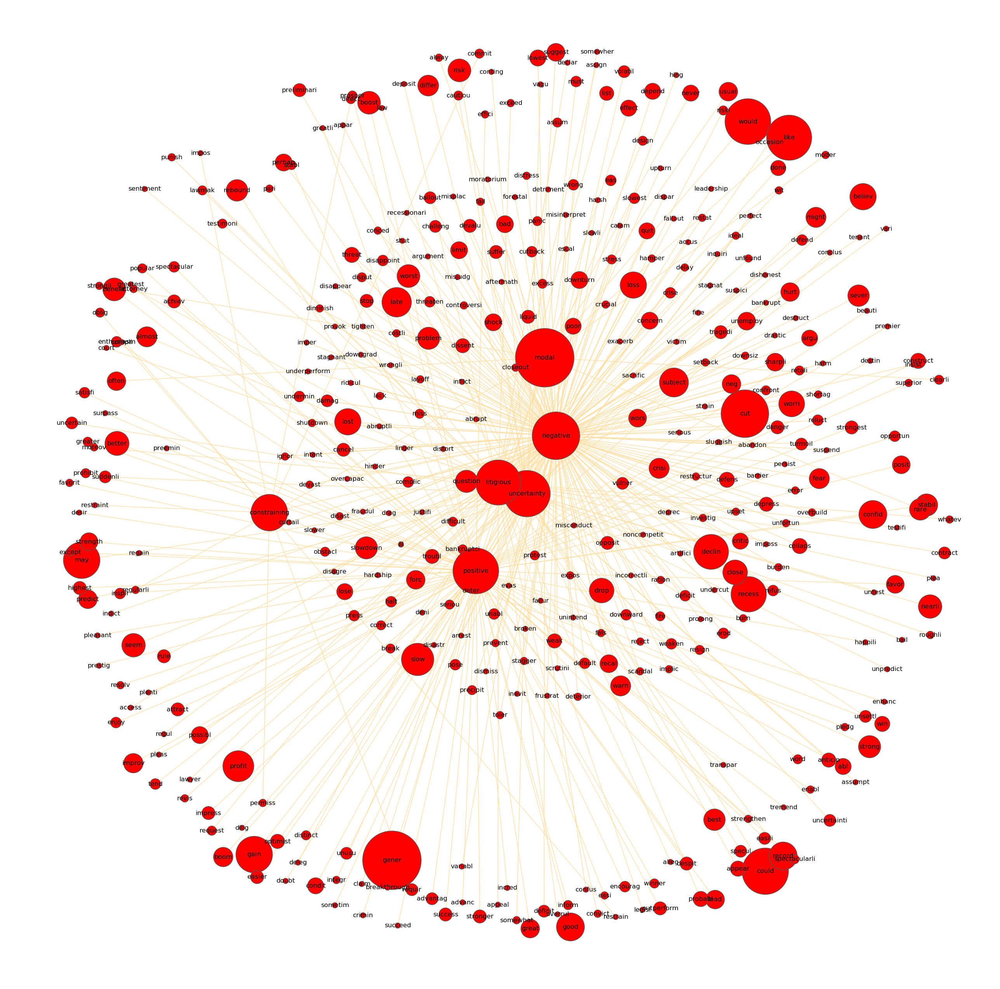

In [403]:
df_nodes = node_00to02
df_edges = node_00to02
import warnings
warnings.filterwarnings('ignore')

G = nx.Graph()
for index, row in df_nodes.iterrows():
    G.add_node(row['name'],group=['Count1'], nodesize=row['count'])
    
for index, row in df_edges.iterrows():
    G.add_weighted_edges_from([(row['name'],row['Label'],row['Weight1'])])
    
color_map = {1:'#f09494', 2:'#eebcbc', 3:'#72bbd0', 4:'#91f0a1', 5:'#629fff', 6:'#bcc2f2'} 

plt.figure(figsize=(25,25))
options = {
    'edge_color': '#FFDEA2',
    'width': 1,
    'with_labels': True,
    'font_weight': 'regular',
}
#colors = [color_map[df_nodes['name']] for node in G]
sizes = [v * 100 for v in df_nodes['count']]

"""
Using the spring layout : 
- k controls the distance between the nodes and varies between 0 and 1
- iterations is the number of times simulated annealing is run
default k=0.1 and iterations=50
"""
nx.draw(G, node_size=sizes, pos=nx.spring_layout(G, k=0.25, iterations=50), **options)
ax = plt.gca()
ax.collections[0].set_edgecolor("#555555") 
plt.show()

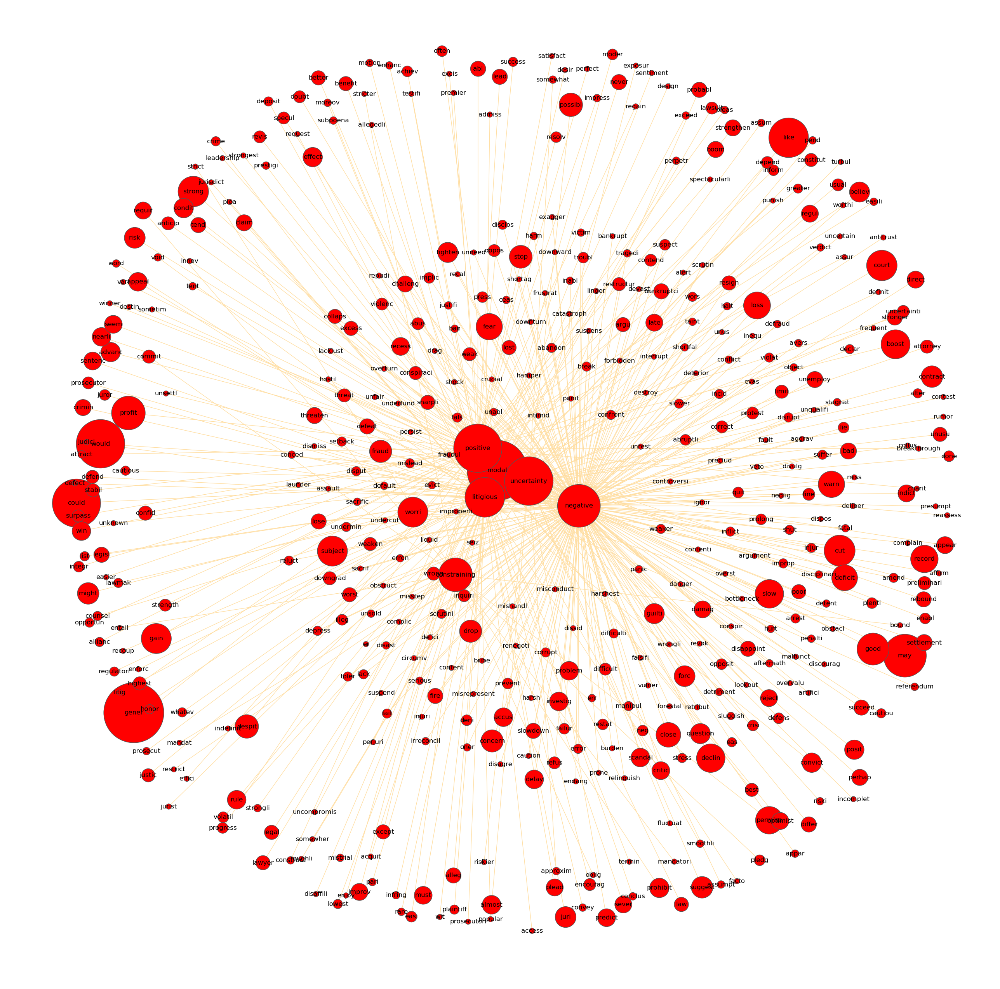

In [404]:
df_nodes = node_03to06
df_edges = node_03to06
import warnings
warnings.filterwarnings('ignore')

G = nx.Graph()
for index, row in df_nodes.iterrows():
    G.add_node(row['name'],group=['Count1'], nodesize=row['count'])
    
for index, row in df_edges.iterrows():
    G.add_weighted_edges_from([(row['name'],row['Label'],row['Weight1'])])
    
color_map = {1:'#f09494', 2:'#eebcbc', 3:'#72bbd0', 4:'#91f0a1', 5:'#629fff', 6:'#bcc2f2'} 

plt.figure(figsize=(25,25))
options = {
    'edge_color': '#FFDEA2',
    'width': 1,
    'with_labels': True,
    'font_weight': 'regular',
}
#colors = [color_map[df_nodes['name']] for node in G]
sizes = [v * 100 for v in df_nodes['count']]

"""
Using the spring layout : 
- k controls the distance between the nodes and varies between 0 and 1
- iterations is the number of times simulated annealing is run
default k=0.1 and iterations=50
"""
nx.draw(G, node_size=sizes, pos=nx.spring_layout(G, k=0.25, iterations=50), **options)
ax = plt.gca()
ax.collections[0].set_edgecolor("#555555") 
plt.show()

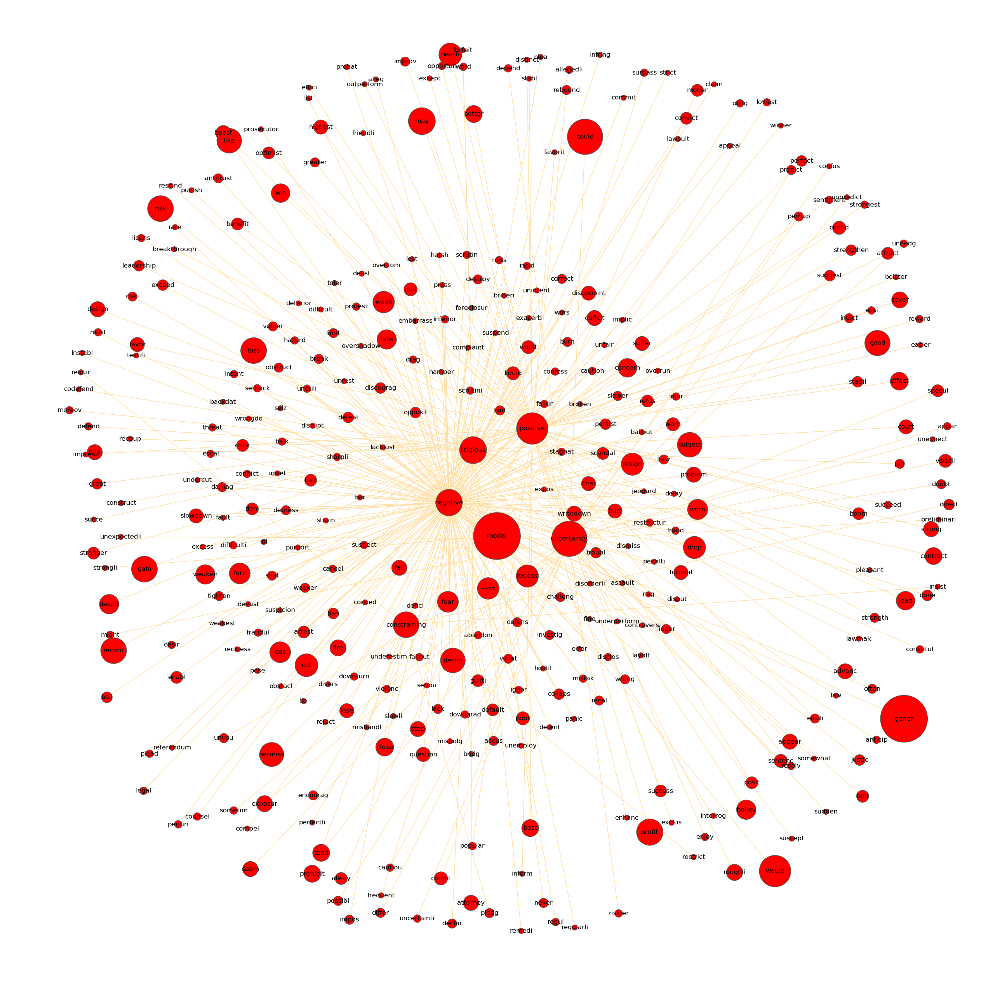

In [405]:
df_nodes = node_07to10
df_edges = node_07to10
import warnings
warnings.filterwarnings('ignore')

G = nx.Graph()
for index, row in df_nodes.iterrows():
    G.add_node(row['name'],group=['Count1'], nodesize=row['count'])
    
for index, row in df_edges.iterrows():
    G.add_weighted_edges_from([(row['name'],row['Label'],row['Weight1'])])
    
color_map = {1:'#f09494', 2:'#eebcbc', 3:'#72bbd0', 4:'#91f0a1', 5:'#629fff', 6:'#bcc2f2'} 

plt.figure(figsize=(25,25))
options = {
    'edge_color': '#FFDEA2',
    'width': 1,
    'with_labels': True,
    'font_weight': 'regular',
}
#colors = [color_map[df_nodes['name']] for node in G]
sizes = [v * 100 for v in df_nodes['count']]

"""
Using the spring layout : 
- k controls the distance between the nodes and varies between 0 and 1
- iterations is the number of times simulated annealing is run
default k=0.1 and iterations=50
"""
nx.draw(G, node_size=sizes, pos=nx.spring_layout(G, k=0.25, iterations=50), **options)
ax = plt.gca()
ax.collections[0].set_edgecolor("#555555") 
plt.show()

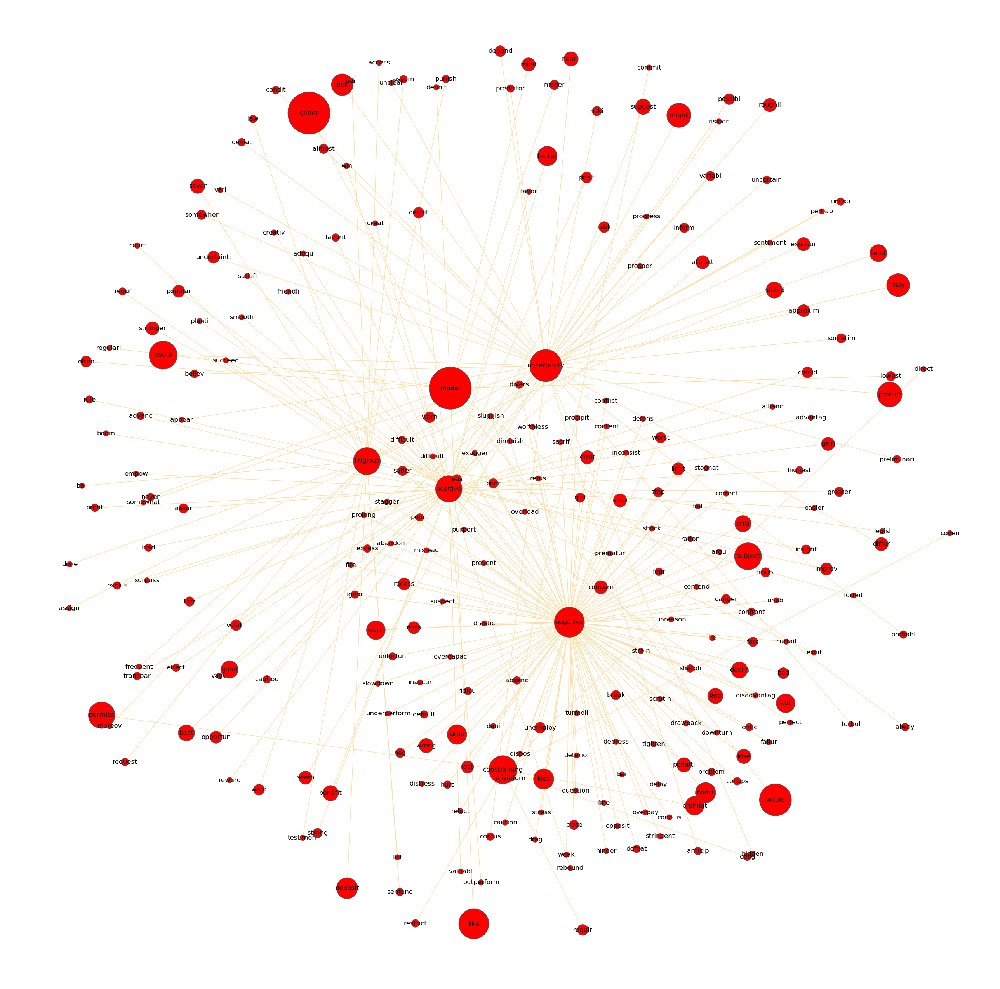

In [406]:
df_nodes = node_11to14
df_edges = node_11to14
import warnings
warnings.filterwarnings('ignore')

G = nx.Graph()
for index, row in df_nodes.iterrows():
    G.add_node(row['name'],group=['Count1'], nodesize=row['count'])
    
for index, row in df_edges.iterrows():
    G.add_weighted_edges_from([(row['name'],row['Label'],row['Weight1'])])
    
color_map = {1:'#f09494', 2:'#eebcbc', 3:'#72bbd0', 4:'#91f0a1', 5:'#629fff', 6:'#bcc2f2'} 

plt.figure(figsize=(25,25))
options = {
    'edge_color': '#FFDEA2',
    'width': 1,
    'with_labels': True,
    'font_weight': 'regular',
}
#colors = [color_map[df_nodes['name']] for node in G]
sizes = [v * 100 for v in df_nodes['count']]

"""
Using the spring layout : 
- k controls the distance between the nodes and varies between 0 and 1
- iterations is the number of times simulated annealing is run
default k=0.1 and iterations=50
"""
nx.draw(G, node_size=sizes, pos=nx.spring_layout(G, k=0.25, iterations=50), **options)
ax = plt.gca()
ax.collections[0].set_edgecolor("#555555") 
plt.show()

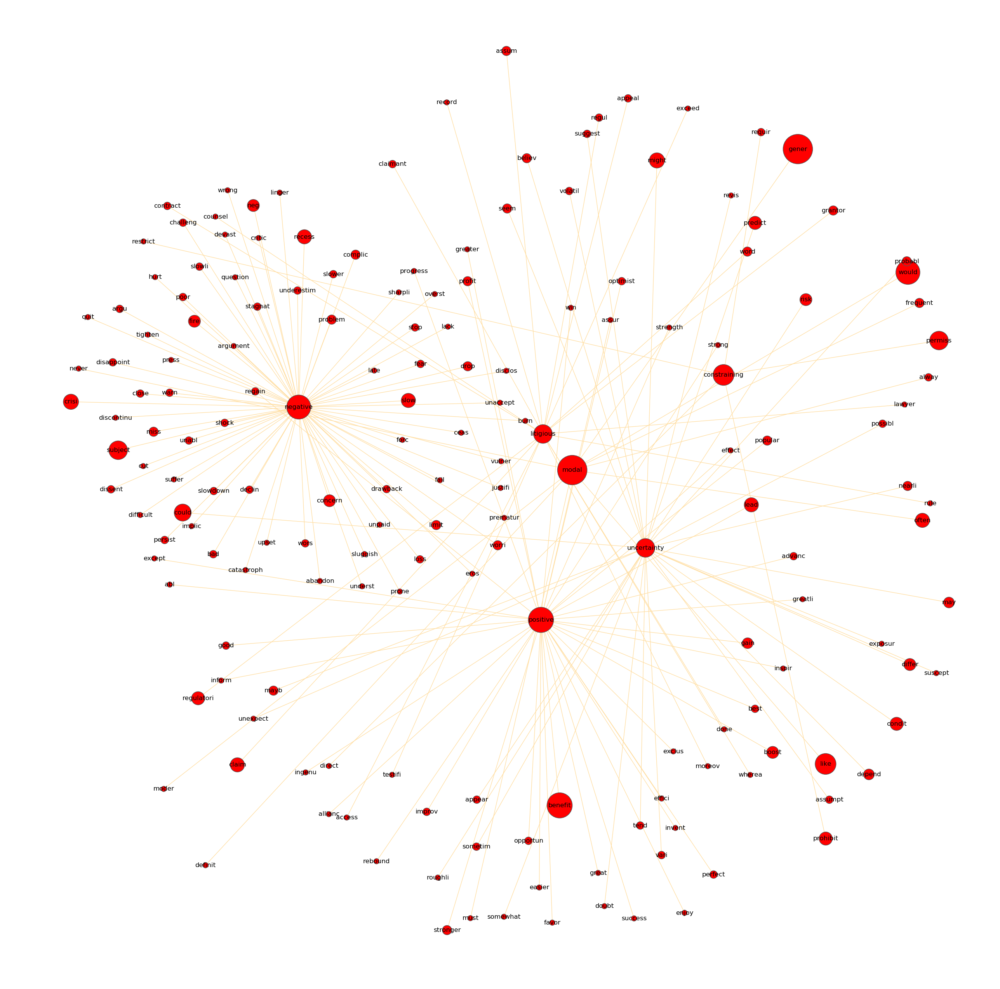

In [407]:
df_nodes = node_15to16
df_edges = node_15to16
import warnings
warnings.filterwarnings('ignore')

G = nx.Graph()
for index, row in df_nodes.iterrows():
    G.add_node(row['name'],group=['Count1'], nodesize=row['count'])
    
for index, row in df_edges.iterrows():
    G.add_weighted_edges_from([(row['name'],row['Label'],row['Weight1'])])
    
color_map = {1:'#f09494', 2:'#eebcbc', 3:'#72bbd0', 4:'#91f0a1', 5:'#629fff', 6:'#bcc2f2'} 

plt.figure(figsize=(25,25))
options = {
    'edge_color': '#FFDEA2',
    'width': 1,
    'with_labels': True,
    'font_weight': 'regular',
}
#colors = [color_map[df_nodes['name']] for node in G]
sizes = [v * 100 for v in df_nodes['count']]

"""
Using the spring layout : 
- k controls the distance between the nodes and varies between 0 and 1
- iterations is the number of times simulated annealing is run
default k=0.1 and iterations=50
"""
nx.draw(G, node_size=sizes, pos=nx.spring_layout(G, k=0.25, iterations=50), **options)
ax = plt.gca()
ax.collections[0].set_edgecolor("#555555") 
plt.show()

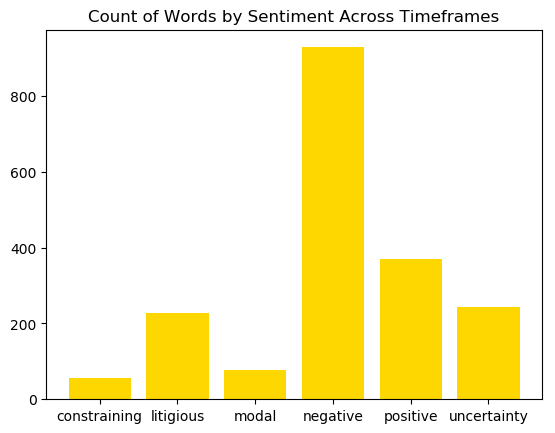

In [324]:
plt.bar(l_count['Label'],l_count['Count_Label'],color='gold')
plt.title('Count of Words by Sentiment Across Timeframes')
plt.show()

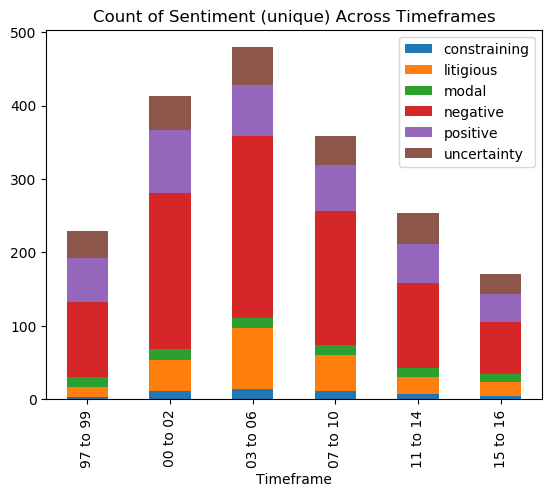

In [326]:
t_count.plot(kind='bar', x="Timeframe", stacked=True, title="Count of Sentiment (unique) Across Timeframes")

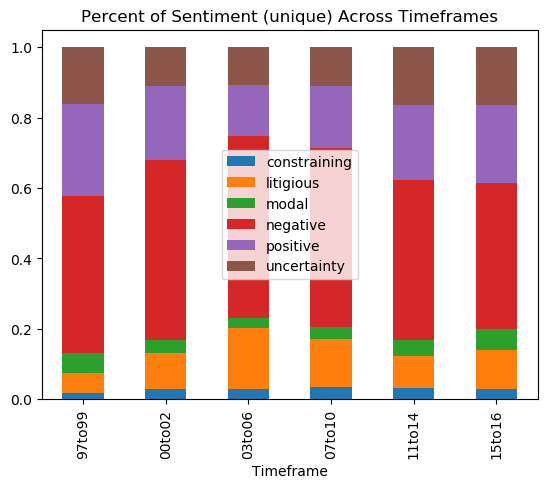

In [341]:
t_perc.plot(kind='bar', x="Timeframe", stacked=True, title="Percent of Sentiment (unique) Across Timeframes")

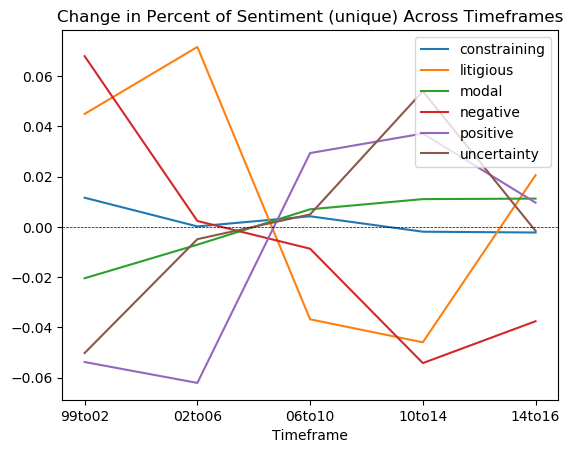

In [362]:
t_pchange.plot(kind='line', x="Timeframe", stacked=False, title="Change in Percent of Sentiment (unique) Across Timeframes")
plt.xticks(np.arange(len(t_pchange['Timeframe'])), t_pchange['Timeframe'])
plt.axhline(y=0, color='black', linestyle='--', lw=0.5)

In [342]:
string_sub = string_cbd1.sort_values(by=['count'], ascending=False)
string_sub = string_sub[['name','count']]
string_sub = string_sub.groupby(['name'])['count'].sum().reset_index()
string_sub = string_sub.sort_values(by=['count'], ascending=False)
string_sub = string_sub[:40]

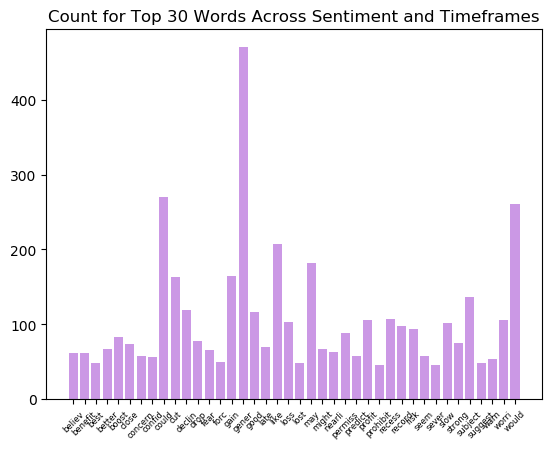

In [343]:
plt.bar(string_sub['name'],string_sub['count'], align='center', alpha=0.5, color='darkorchid')
plt.xticks(fontsize=6,rotation=45)
plt.title('Count for Top 30 Words Across Timeframes')
plt.show()

In [348]:
crossm_sub = cross_merged.sort_values(by=['Total'], ascending=False)
crossm_sub = crossm_sub[['name','Total']]
crossm_sub = crossm_sub.groupby(['name'])['Total'].sum().reset_index()
crossm_sub = crossm_sub.sort_values(by=['Total'], ascending=False)
crossm_sub = crossm_sub[:40]

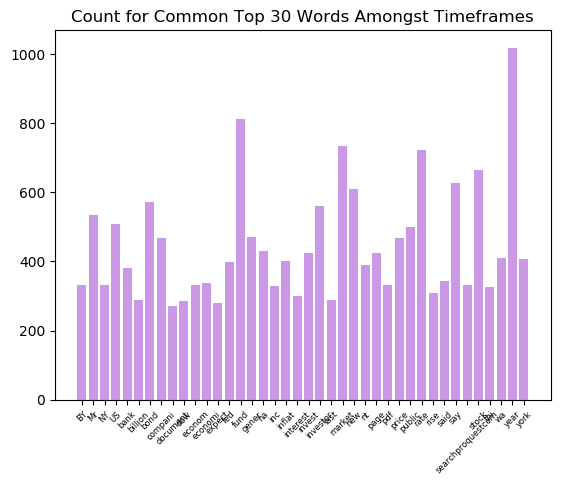

In [347]:
plt.bar(crossm_sub['name'],crossm_sub['Total'], align='center', alpha=0.5, color='darkorchid')
plt.xticks(fontsize=6,rotation=45)
plt.title('Count for Common Top 30 Words Amongst Timeframes')
plt.show()

In [240]:
cross_merged_sub = cross_merged[['name','Total']]
cross_merged_sub.columns = range(cross_merged_sub.shape[1])

In [411]:
string_sub2 = string_cbd1.sort_values(by=['count'], ascending=False)
string_sub2 = string_sub2[['name','count']]
string_sub2.columns = range(string_sub2.shape[1])

In [428]:
string_cbd3 = string_cbd1[(string_cbd1.Timeframe == '97 to 99')]
string_sub3 = string_cbd3.sort_values(by=['count'], ascending=False)
string_97to99 = string_sub3[['name','count']]
string_97to99.columns = range(string_97t099.shape[1])

string_cbd4 = string_cbd1[(string_cbd1.Timeframe == '00 to 02')]
string_sub4 = string_cbd4.sort_values(by=['count'], ascending=False)
string_00to02 = string_sub4[['name','count']]
string_00to02.columns = range(string_00to02.shape[1])

string_cbd5 = string_cbd1[(string_cbd1.Timeframe == '03 to 06')]
string_sub5 = string_cbd5.sort_values(by=['count'], ascending=False)
string_03to06 = string_sub5[['name','count']]
string_03to06.columns = range(string_03to06.shape[1])

string_cbd6 = string_cbd1[(string_cbd1.Timeframe == '07 to 10')]
string_sub6 = string_cbd6.sort_values(by=['count'], ascending=False)
string_07to10 = string_sub6[['name','count']]
string_07to10.columns = range(string_07to10.shape[1])

string_cbd7 = string_cbd1[(string_cbd1.Timeframe == '11 to 14')]
string_sub7 = string_cbd7.sort_values(by=['count'], ascending=False)
string_11to14 = string_sub7[['name','count']]
string_11to14.columns = range(string_11to14.shape[1])

string_cbd8 = string_cbd1[(string_cbd1.Timeframe == '15 to 16')]
string_sub8 = string_cbd8.sort_values(by=['count'], ascending=False)
string_15to16 = string_sub8[['name','count']]
string_15to16.columns = range(string_15to16.shape[1])

In [417]:
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=200,
        max_font_size=40, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
    ).generate(str(data))

    fig = plt.figure(1, figsize=(12, 12))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

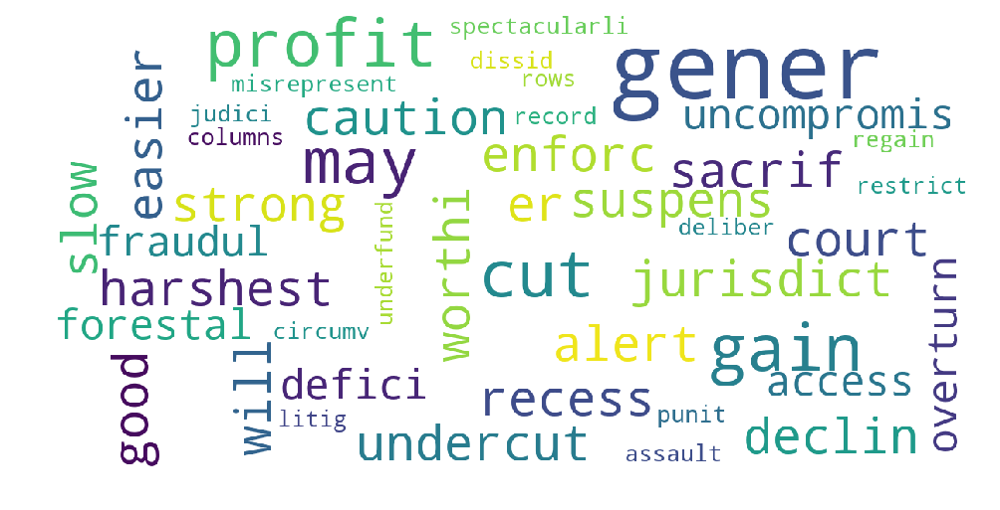

In [418]:
combined_string = show_wordcloud(string_sub2)
combined_string

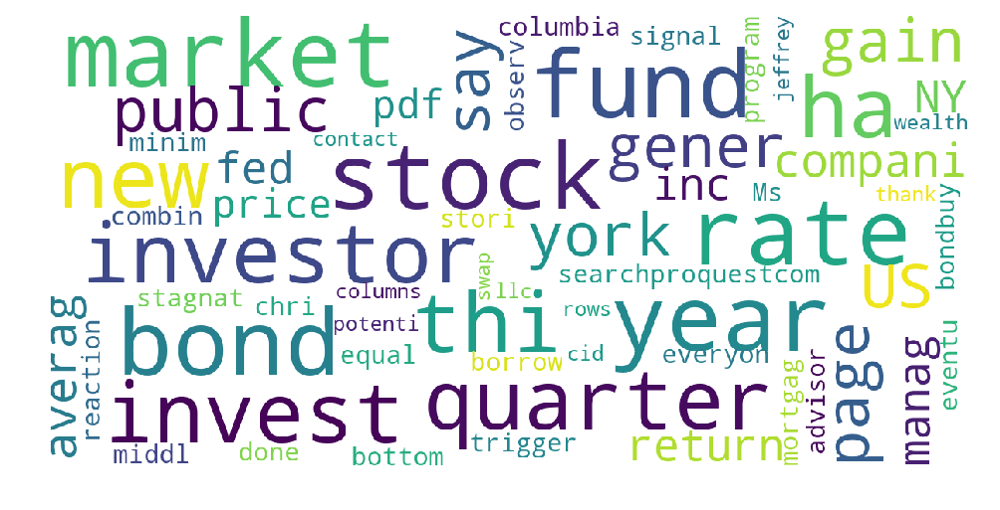

In [419]:
crossmerge_string = show_wordcloud(cross_merged_sub)
crossmerge_string

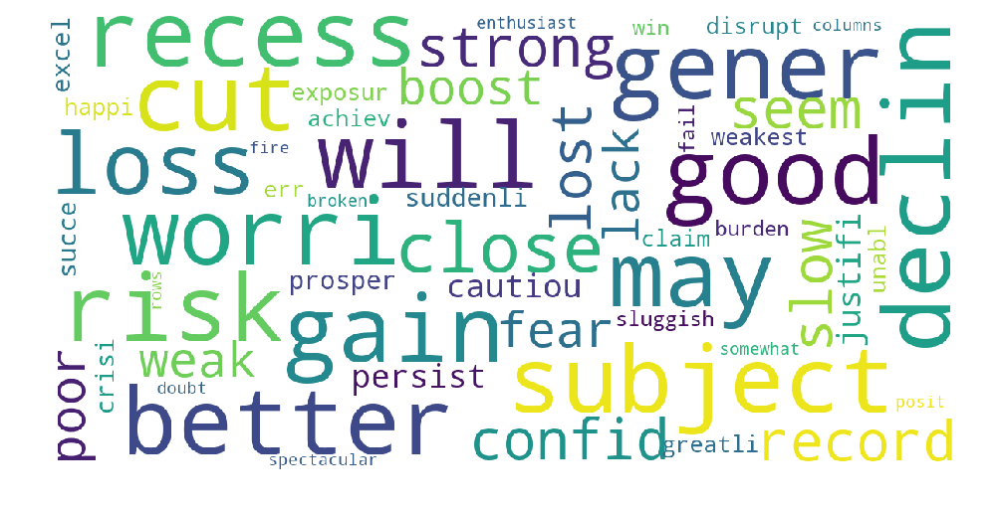

In [429]:
cloud_97to99 = show_wordcloud(string_97to99)
cloud_97to99

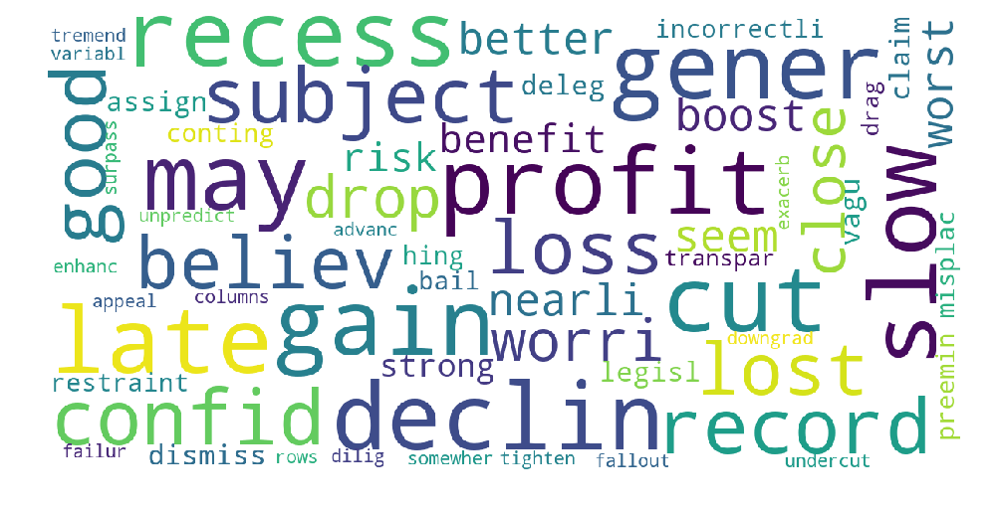

In [421]:
cloud_00to02 = show_wordcloud(string_00to02)
cloud_00to02

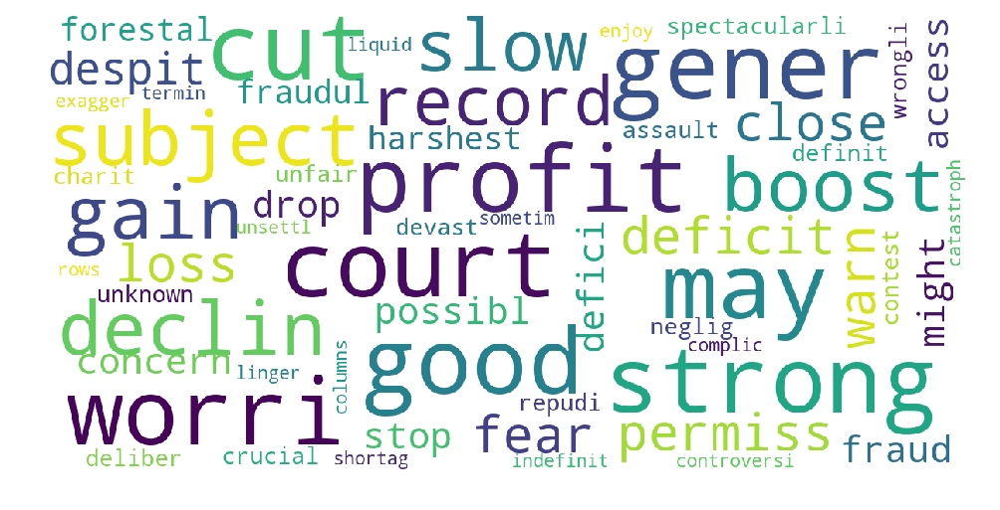

In [422]:
cloud_03to06 = show_wordcloud(string_03to06)
cloud_03to06

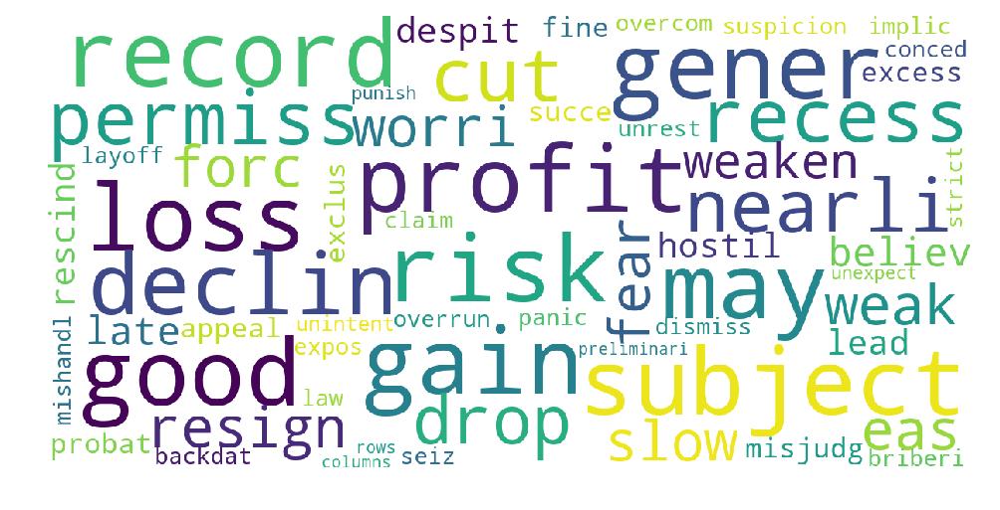

In [423]:
cloud_07to10 = show_wordcloud(string_07to10)
cloud_07to10

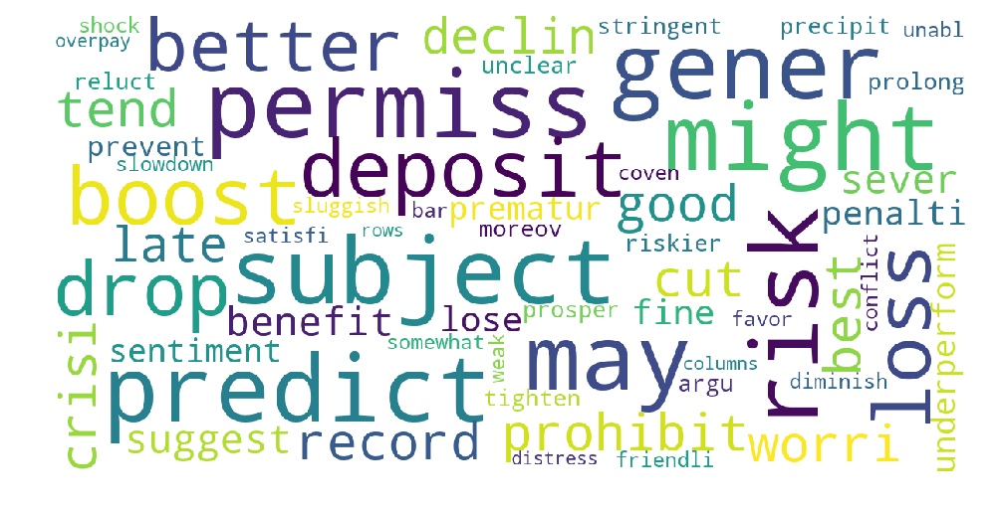

In [424]:
cloud_11to14 = show_wordcloud(string_11to14)
cloud_11to14

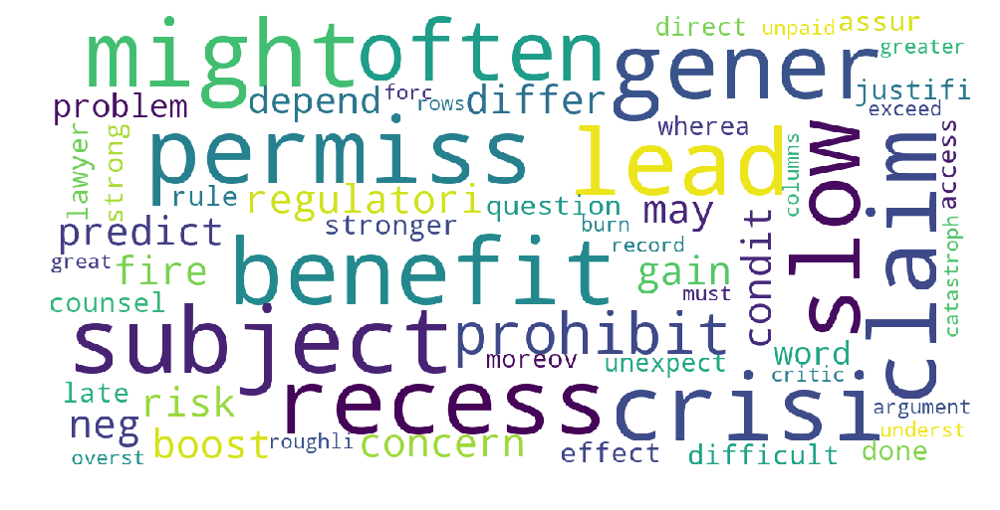

In [425]:
cloud_15to16 = show_wordcloud(string_15to16)
cloud_15to16